In [62]:
#!pip install graphviz
#!pip install ipywidgets
#%pip install ipywidgets
#%pip install ipywidgets --upgrade


# Análise do Dataset Olist - Projeto Triggo.ai

## 1. Introdução

Este notebook apresenta uma análise exploratória do dataset público do Olist, com foco em entender o comportamento de pedidos, tempos de entrega, e preparar os dados para análises futuras.  
O objetivo é demonstrar habilidades em manipulação, visualização e modelagem de dados, bem como consultas SQL usando SQLite em memória.

---

## 2. Importação de Bibliotecas e Configurações Iniciais

In [213]:
# Bibliotecas de análise e visualização
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from graphviz import Digraph
import sqlite3
import os
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import ipywidgets as widgets
from IPython.display import display
import json
from urllib.request import urlopen
import plotly.graph_objects as go
from IPython.display import display, clear_output
from ipywidgets import Tab, Output, VBox
from plotly.subplots import make_subplots

# Configurações visuais
plt.style.use('default')
sns.set_palette('viridis')
%matplotlib inline

# Caminho para o executável dot (ajuste se estiver em outro local)
os.environ["PATH"] += os.pathsep + r"C:\Program Files\Graphviz\bin"

---

## 3. Carregamento dos Dados

In [67]:
# Carregando os datasets
customers = pd.read_csv('olist_customers_dataset.csv')
geolocation = pd.read_csv('olist_geolocation_dataset.csv')
order_items = pd.read_csv('olist_order_items_dataset.csv')
order_payments = pd.read_csv('olist_order_payments_dataset.csv')
order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
orders = pd.read_csv('olist_orders_dataset.csv')
products = pd.read_csv('olist_products_dataset.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv')
product_category_translation = pd.read_csv('product_category_name_translation.csv')

# Função para resumo geral dos dataframes
def resumo_df(df):
    return pd.DataFrame({
        'Tipo': df.dtypes,
        'Nulos (%)': df.isnull().mean() * 100,
        'Únicos': df.nunique(),
        'Exemplos': df.apply(lambda x: ', '.join(map(str, x.dropna().unique()[:3])))
    })

# Resumo para cada dataframe
for nome, df in zip(
    ['customers', 'geolocation', 'order_items', 'order_payments', 'order_reviews', 'orders', 'products', 'sellers', 'product_category_translation'],
    [customers, geolocation, order_items, order_payments, order_reviews, orders, products, sellers, product_category_translation]
):
    print(f"\n{nome.upper()}")
    display(resumo_df(df))



CUSTOMERS


,Tipo,Nulos (%),Únicos,Exemplos
customer_id,object,0.0,99441,"06b8999e2fba1a1fbc88172c00ba8bc7, 18955e83d337..."
customer_unique_id,object,0.0,96096,"861eff4711a542e4b93843c6dd7febb0, 290c77bc529b..."
customer_zip_code_prefix,int64,0.0,14994,"14409, 9790, 1151"
customer_city,object,0.0,4119,"franca, sao bernardo do campo, sao paulo"
customer_state,object,0.0,27,"SP, SC, MG"



GEOLOCATION


,Tipo,Nulos (%),Únicos,Exemplos
geolocation_zip_code_prefix,int64,0.0,19015,"1037, 1046, 1041"
geolocation_lat,float64,0.0,717360,"-23.54562128115268, -23.54608112703553, -23.54..."
geolocation_lng,float64,0.0,717613,"-46.63929204800168, -46.64482029837157, -46.64..."
geolocation_city,object,0.0,8011,"sao paulo, são paulo, sao bernardo do campo"
geolocation_state,object,0.0,27,"SP, RN, AC"



ORDER_ITEMS


,Tipo,Nulos (%),Únicos,Exemplos
order_id,object,0.0,98666,"00010242fe8c5a6d1ba2dd792cb16214, 00018f77f2f0..."
order_item_id,int64,0.0,21,"1, 2, 3"
product_id,object,0.0,32951,"4244733e06e7ecb4970a6e2683c13e61, e5f2d52b8021..."
seller_id,object,0.0,3095,"48436dade18ac8b2bce089ec2a041202, dd7ddc04e1b6..."
shipping_limit_date,object,0.0,93318,"2017-09-19 09:45:35, 2017-05-03 11:05:13, 2018..."
price,float64,0.0,5968,"58.9, 239.9, 199.0"
freight_value,float64,0.0,6999,"13.29, 19.93, 17.87"



ORDER_PAYMENTS


,Tipo,Nulos (%),Únicos,Exemplos
order_id,object,0.0,99440,"b81ef226f3fe1789b1e8b2acac839d17, a9810da82917..."
payment_sequential,int64,0.0,29,"1, 2, 4"
payment_type,object,0.0,5,"credit_card, boleto, voucher"
payment_installments,int64,0.0,24,"8, 1, 2"
payment_value,float64,0.0,29077,"99.33, 24.39, 65.71"



ORDER_REVIEWS


,Tipo,Nulos (%),Únicos,Exemplos
review_id,object,0.000000,98410,"7bc2406110b926393aa56f80a40eba40, 80e641a11e56..."
order_id,object,0.000000,98673,"73fc7af87114b39712e6da79b0a377eb, a548910a1c61..."
review_score,int64,0.000000,5,"4, 5, 1"
review_comment_title,object,88.341530,4527,"recomendo, Super recomendo, Não chegou meu pro..."
review_comment_message,object,58.702532,36159,"Recebi bem antes do prazo estipulado., Parabén..."
review_creation_date,object,0.000000,636,"2018-01-18 00:00:00, 2018-03-10 00:00:00, 2018..."
review_answer_timestamp,object,0.000000,98248,"2018-01-18 21:46:59, 2018-03-11 03:05:13, 2018..."



ORDERS


,Tipo,Nulos (%),Únicos,Exemplos
order_id,object,0.000000,99441,"e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc7..."
customer_id,object,0.000000,99441,"9ef432eb6251297304e76186b10a928d, b0830fb4747a..."
order_status,object,0.000000,8,"delivered, invoiced, shipped"
order_purchase_timestamp,object,0.000000,98875,"2017-10-02 10:56:33, 2018-07-24 20:41:37, 2018..."
order_approved_at,object,0.160899,90733,"2017-10-02 11:07:15, 2018-07-26 03:24:27, 2018..."
order_delivered_carrier_date,object,1.793023,81018,"2017-10-04 19:55:00, 2018-07-26 14:31:00, 2018..."
order_delivered_customer_date,object,2.981668,95664,"2017-10-10 21:25:13, 2018-08-07 15:27:45, 2018..."
order_estimated_delivery_date,object,0.000000,459,"2017-10-18 00:00:00, 2018-08-13 00:00:00, 2018..."



PRODUCTS


,Tipo,Nulos (%),Únicos,Exemplos
product_id,object,0.000000,32951,"1e9e8ef04dbcff4541ed26657ea517e5, 3aa071139cb1..."
product_category_name,object,1.851234,73,"perfumaria, artes, esporte_lazer"
product_name_lenght,float64,1.851234,66,"40.0, 44.0, 46.0"
product_description_lenght,float64,1.851234,2960,"287.0, 276.0, 250.0"
product_photos_qty,float64,1.851234,19,"1.0, 4.0, 2.0"
product_weight_g,float64,0.006070,2204,"225.0, 1000.0, 154.0"
product_length_cm,float64,0.006070,99,"16.0, 30.0, 18.0"
product_height_cm,float64,0.006070,102,"10.0, 18.0, 9.0"
product_width_cm,float64,0.006070,95,"14.0, 20.0, 15.0"



SELLERS


,Tipo,Nulos (%),Únicos,Exemplos
seller_id,object,0.0,3095,"3442f8959a84dea7ee197c632cb2df15, d1b65fc7debc..."
seller_zip_code_prefix,int64,0.0,2246,"13023, 13844, 20031"
seller_city,object,0.0,611,"campinas, mogi guacu, rio de janeiro"
seller_state,object,0.0,23,"SP, RJ, PE"



PRODUCT_CATEGORY_TRANSLATION


,Tipo,Nulos (%),Únicos,Exemplos
product_category_name,object,0.0,71,"beleza_saude, informatica_acessorios, automotivo"
product_category_name_english,object,0.0,71,"health_beauty, computers_accessories, auto"


---

## 4. Tratamento dos Dados

Vamos tratar valores nulos, padronizar nomes de colunas, remover duplicatas e converter datas para o tipo datetime, preparando os dados para análise.


In [69]:
# Preenchimento e tratamento dos dados

# Customers: Sem nulos

# Orders: Alguns nulos em 
# order_approved_at,
# order_delivered_carrier_date,
# order_delivered_customer_date

# Esses campos podem estar vazios por pedidos cancelados ou não entregues — vamos manter, mas sinalizar

# converter datas
for col in ['order_approved_at',
            'order_delivered_carrier_date',
            'order_delivered_customer_date',
            'order_estimated_delivery_date']:
    orders[col] = pd.to_datetime(orders[col])

# Reviews - preencher comentários nulos
order_reviews['review_comment_title'] = order_reviews['review_comment_title'].fillna('Sem título')
order_reviews['review_comment_message'] = order_reviews['review_comment_message'].fillna('Sem comentário')

# Products - preencher categoria nula
products['product_category_name'] = products['product_category_name'].fillna('sem_categoria')

# Geolocation - remover nulos (limpeza inicial)
geolocation.dropna(inplace=True)

# Remover duplicatas
for df in [customers, geolocation, order_items, order_payments, order_reviews, orders, products, sellers]:
    df.drop_duplicates(inplace=True)

# Padronizar nomes das colunas para snake_case
def padronizar_colunas(df):
    df.columns = (
        df.columns.str.strip()
                  .str.lower()
                  .str.replace(" ", "_")
                  .str.replace("-", "_")
    )
    return df

# Aplicar padronização
customers = padronizar_colunas(customers)
geolocation = padronizar_colunas(geolocation)
order_items = padronizar_colunas(order_items)
order_payments = padronizar_colunas(order_payments)
order_reviews = padronizar_colunas(order_reviews)
orders = padronizar_colunas(orders)
products = padronizar_colunas(products)
sellers = padronizar_colunas(sellers)

# Confirmar valores nulos remanescentes
print("Nulos remanescentes após tratamento:")
for nome, df in zip(
    ['customers', 'geolocation', 'order_items', 'order_payments', 'order_reviews', 'orders', 'products', 'sellers'],
    [customers, geolocation, order_items, order_payments, order_reviews, orders, products, sellers]
):
    print(f"{nome}: {df.isnull().sum().sum()} nulos")


Nulos remanescentes após tratamento:
customers: 0 nulos
geolocation: 0 nulos
order_items: 0 nulos
order_payments: 0 nulos
order_reviews: 0 nulos
orders: 4908 nulos
products: 1838 nulos
sellers: 0 nulos


Explicação dos principais tratamentos: Tabela Ação tomada Justificativa orders Mantidos os nulos em datas específicas Alguns pedidos podem não ter sido entregues order_reviews Preenchidos com texto padrão Permite análise textual sem perder linhas products Categoria preenchida como 'sem_categoria' Evita problemas em joins/agrupamentos geolocation Remoção de linhas com nulos Latitude/longitude incompletas não ajudam

In [71]:
# Relação entre orders e customers
orders_customers = orders.merge(customers, on='customer_id', how='inner')
print(f"Pedidos com clientes vinculados: {len(orders_customers)}")

# Relação entre orders e order_items
orders_items = orders.merge(order_items, on='order_id', how='inner')
print(f"Pedidos com itens vinculados: {len(orders_items)}")

# Relação entre orders e payments
orders_payments = orders.merge(order_payments, on='order_id', how='inner')
print(f"Pedidos com pagamentos vinculados: {len(orders_payments)}")

# Relação entre order_items e products
items_products = order_items.merge(products, on='product_id', how='inner')
print(f"Itens com produtos vinculados: {len(items_products)}")

# Relação entre order_items e sellers
items_sellers = order_items.merge(sellers, on='seller_id', how='inner')
print(f"Itens com vendedores vinculados: {len(items_sellers)}")

Pedidos com clientes vinculados: 99441
Pedidos com itens vinculados: 112650
Pedidos com pagamentos vinculados: 103886
Itens com produtos vinculados: 112650
Itens com vendedores vinculados: 112650


✅ Interpretação dos Resultados
Verificação	Total de Registros	Interpretação
Pedidos com clientes vinculados	99.441	Igual ao total de registros da tabela orders. Todos os pedidos têm um cliente. ✅
Pedidos com itens vinculados	112.650	Cada pedido pode conter vários itens. Aqui temos a granularidade item a item (1:N). ✅
Pedidos com pagamentos vinculados	103.886	Um pouco menor que o total de pedidos — alguns pedidos podem não ter registros de pagamento (problema real ou inconsistência). ⚠️
Itens com produtos vinculados	112.650	Todos os itens têm produto associado. ✅
Itens com vendedores vinculados	112.650	Todos os itens têm vendedor associado. ✅

In [73]:
# Quantidade de pagamentos por pedido
pagamentos_por_pedido = order_payments.groupby('order_id').size().value_counts().sort_index()
print(pagamentos_por_pedido)

1     96479
2      2382
3       301
4       108
5        52
6        36
7        28
8        11
9         9
10        5
11        8
12        8
13        3
14        2
15        2
19        2
21        1
22        1
26        1
29        1
Name: count, dtype: int64


📊 Distribuição de pagamentos por pedido Nº de pagamentos por pedido Nº de pedidos 1 parcela 96.479 2 parcelas 2.382 3 parcelas 301 4 parcelas 108 ... até 29 parcelas casos raros

---

## 5. Modelagem Relacional e Banco de Dados SQLite em Memória

Vamos montar um banco SQLite em memória para executar consultas SQL durante a análise.

Além disso, criamos um diagrama do modelo relacional para visualizar as relações entre as tabelas.



O dataset da Olist possui uma estrutura relacional centrada na tabela de pedidos (orders). Abaixo, os relacionamentos entre as principais tabelas:

orders

↔️ customers via customer_id

↔️ order_items via order_id

↔️ order_payments via order_id

↔️ order_reviews via order_id

order_items

↔️ products via product_id

↔️ sellers via seller_id

products

↔️ product_category_name_translation via product_category_name

### Modelo Relacional e Conexão com SQL

In [75]:
#Banco SQLite em memória e carregar tabelas
conn = sqlite3.connect(':memory:')

tables = {
    'customers': customers,
    'geolocation': geolocation,
    'order_items': order_items,
    'order_payments': order_payments,
    'order_reviews': order_reviews,
    'orders': orders,
    'products': products,
    'sellers': sellers,
    'product_translation': product_category_translation
}

for nome, df in tables.items():
    df.to_sql(nome, conn, index=False, if_exists='replace')

cursor = conn.cursor()
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print("Tabelas no banco SQLite:")
for tabela in cursor.fetchall():
    print("-", tabela[0])


Tabelas no banco SQLite:
- customers
- geolocation
- order_items
- order_payments
- order_reviews
- orders
- products
- sellers
- product_translation


### Diagrama do modelo relacional com Graphviz

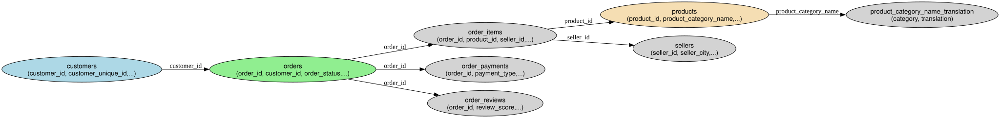

In [77]:
dot = Digraph(format='png')
dot.attr(rankdir='LR', bgcolor='white')
dot.attr('node', shape='ellipse', style='filled', fillcolor='lightgray', fontname='Helvetica')

dot.node('customers', 'customers\n(customer_id, customer_unique_id,...)', fillcolor='lightblue')
dot.node('orders', 'orders\n(order_id, customer_id, order_status,...)', fillcolor='lightgreen')
dot.node('order_items', 'order_items\n(order_id, product_id, seller_id,...)')
dot.node('order_payments', 'order_payments\n(order_id, payment_type,...)')
dot.node('order_reviews', 'order_reviews\n(order_id, review_score,...)')
dot.node('products', 'products\n(product_id, product_category_name,...)', fillcolor='wheat')
dot.node('sellers', 'sellers\n(seller_id, seller_city,...)')
dot.node('product_translation', 'product_category_name_translation\n(category, translation)')

dot.edge('customers', 'orders', label='customer_id')
dot.edge('orders', 'order_items', label='order_id')
dot.edge('orders', 'order_payments', label='order_id')
dot.edge('orders', 'order_reviews', label='order_id')
dot.edge('order_items', 'products', label='product_id')
dot.edge('order_items', 'sellers', label='seller_id')
dot.edge('products', 'product_translation', label='product_category_name')

dot.render('modelo_relacional', cleanup=True)
dot


Aqui, para fins de teste analisamos a quantidade de pedidos agrupada por estado do cliente.

In [79]:
query = """
SELECT
    customer_state,
    COUNT(*) AS total_pedidos
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
GROUP BY customer_state
ORDER BY total_pedidos DESC
"""

df_estado = pd.read_sql(query, conn)
df_estado.head()


,customer_state,total_pedidos
0,SP,41746
1,RJ,12852
2,MG,11635
3,RS,5466
4,PR,5045


---

## 6. Análise Exploratória:


### a) Qual o volume de pedidos por mês? Existe sazonalidade nas vendas?

**Passo 1:** Agrupar pedidos por mês (order_purchase_timestamp)<br> **Passo 2:** Visualizar com gráfico de linha

    ano_mes  quantidade_pedidos
0   2016-09                   4
1   2016-10                 324
2   2016-12                   1
3   2017-01                 800
4   2017-02                1780
5   2017-03                2682
6   2017-04                2404
7   2017-05                3700
8   2017-06                3245
9   2017-07                4026
10  2017-08                4331
11  2017-09                4285
12  2017-10                4631
13  2017-11                7544
14  2017-12                5673
15  2018-01                7269
16  2018-02                6728
17  2018-03                7211
18  2018-04                6939
19  2018-05                6873
20  2018-06                6167
21  2018-07                6292
22  2018-08                6512
23  2018-09                  16
24  2018-10                   4


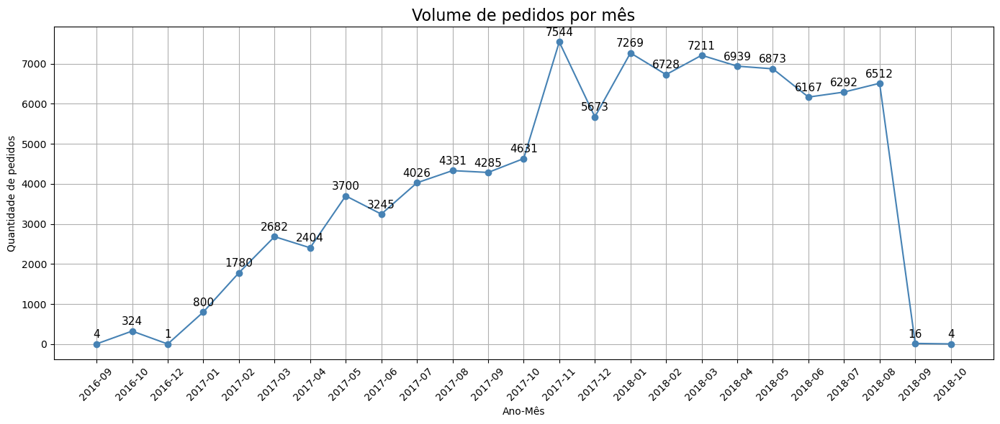

In [81]:
# Convertendo para datetime (se ainda não estiver)
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])

# Extraindo ano e mês e agrupando por ano_mes
orders['ano_mes'] = orders['order_purchase_timestamp'].dt.to_period('M')
pedidos_por_mes = orders.groupby('ano_mes')['order_id'].nunique().reset_index()

# Renomeando colunas
pedidos_por_mes.columns = ['ano_mes', 'quantidade_pedidos']

# Exibindo
print(pedidos_por_mes)

# Plotando para identificar sazonalidade
fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(
        pedidos_por_mes['ano_mes'].astype(str),
        pedidos_por_mes['quantidade_pedidos'],
        marker='o', color='steelblue')

ax.set_title('Volume de pedidos por mês', fontsize=16)
ax.set_xlabel('Ano-Mês')
ax.set_ylabel('Quantidade de pedidos')

ax.tick_params(axis='x', rotation=45)
ax.grid(True)

# Fundo branco
#fig.patch.set_facecolor('white')
#ax.set_facecolor('white')

# Remover bordas superior e direita
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)

# Adicionando rótulos afastados dos pontos
for i, row in pedidos_por_mes.iterrows():
    ax.text(
        x=i,  # posição no eixo x como índice para alinhar com ticks
        y=row['quantidade_pedidos'] + 150,  # afastamento do ponto
        s=str(row['quantidade_pedidos']),
        ha='center',
        fontsize=11,
        color='black'
    )

plt.tight_layout()
plt.show()


#### Conclusão: Existe sazonalidade nas vendas?

Ao analisar o volume de pedidos por mês ao longo do período de setembro de 2016 a outubro de 2018, observamos alguns pontos importantes:

- O número de pedidos cresce de forma consistente a partir do início de 2017, atingindo picos entre os meses de **outubro e dezembro**, com destaque para novembro e dezembro de 2017 e janeiro a março de 2018.
- Esse aumento no final do ano pode indicar **sazonalidade relacionada a datas comemorativas e períodos promocionais**, como Black Friday e Natal.
- No entanto, notamos também meses com volumes muito baixos ou quase inexistentes, como setembro e dezembro de 2016, e setembro e outubro de 2018. Isso pode ser efeito de dados incompletos nesses períodos ou variações específicas.
- De modo geral, a tendência sugere que existe sim uma sazonalidade nas vendas, com maiores volumes concentrados no final do ano e início do seguinte.

Essa análise permite ao negócio planejar melhor estoques e campanhas promocionais, aproveitando os períodos de maiordemanda.

### b) Qual a distribuição do tempo de entrega dos pedidos?

**Passo 1:** Calcular o tempo de entrega (em dias). <br>
Usamos as colunas: <br>
order_delivered_customer_date, <br>
order_purchase_timestamp

**Passo 2:** Plotar a distribuição

In [83]:
# Calculando o tempo de entrega em dias
orders['delivery_time_days'] = (orders['order_delivered_customer_date'] - orders['order_purchase_timestamp']).dt.days

# Removendo entregas nulas (ex: pedidos cancelados)
orders_valid = orders[orders['delivery_time_days'].notnull()]


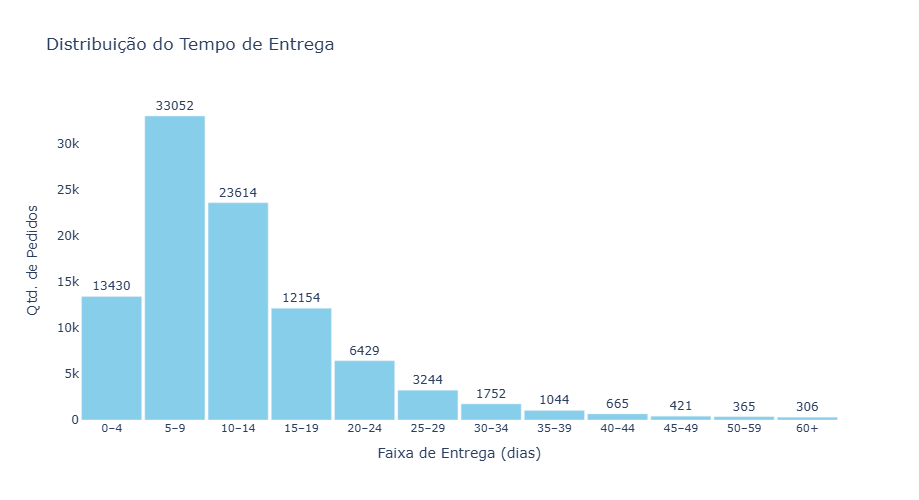

In [85]:
# Cópia dos dados válidos
df_plot = orders_valid.copy()

# Definindo as faixas (bins) e seus rótulos
bins = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, float('inf')]
labels = [
    '0–4', '5–9', '10–14', '15–19', '20–24', '25–29',
    '30–34', '35–39', '40–44', '45–49', '50–59', '60+'
]

# Criar faixa de entrega
df_plot['faixa_entrega'] = pd.cut(
    df_plot['delivery_time_days'],
    bins=bins,
    labels=labels,
    right=False
)

# Agrupar por faixa
faixa_counts = df_plot['faixa_entrega'].value_counts().sort_index().reset_index()
faixa_counts.columns = ['faixa_entrega', 'quantidade_pedidos']

fig = px.bar(
    faixa_counts,
    x='faixa_entrega',
    y='quantidade_pedidos',
    text='quantidade_pedidos',
    color_discrete_sequence=['skyblue'],
    labels={
        'faixa_entrega': 'Faixa de Entrega (dias)',
        'quantidade_pedidos': 'Quantidade de pedidos'
    },
    title='Distribuição do Tempo de Entrega'
)

# Ajustes visuais
fig.update_traces(textposition='outside')
fig.update_layout(
    showlegend=False,
    xaxis_title='Faixa de Entrega (dias)',
    yaxis_title='Qtd. de Pedidos',
    plot_bgcolor='white',
    bargap=0.05,
    width=1000,
    height=500,
    xaxis=dict(
        tickangle=0,
        tickfont=dict(size=11)
    )
)

fig.show()


In [87]:
query = """
WITH delivery_times AS (
    SELECT 
        order_id,
        CAST(julianday(order_delivered_customer_date) - julianday(order_purchase_timestamp) AS INTEGER) AS delivery_days
    FROM orders
    WHERE order_delivered_customer_date IS NOT NULL
      AND order_purchase_timestamp IS NOT NULL
),
delivery_bins AS (
    SELECT 
        delivery_days,
        CASE
            WHEN delivery_days BETWEEN 0 AND 4 THEN '0–4'
            WHEN delivery_days BETWEEN 5 AND 9 THEN '5–9'
            WHEN delivery_days BETWEEN 10 AND 14 THEN '10–14'
            WHEN delivery_days BETWEEN 15 AND 19 THEN '15–19'
            WHEN delivery_days BETWEEN 20 AND 24 THEN '20–24'
            WHEN delivery_days BETWEEN 25 AND 29 THEN '25–29'
            WHEN delivery_days BETWEEN 30 AND 34 THEN '30–34'
            WHEN delivery_days BETWEEN 35 AND 39 THEN '35–39'
            WHEN delivery_days BETWEEN 40 AND 44 THEN '40–44'
            WHEN delivery_days BETWEEN 45 AND 49 THEN '45–49'
            WHEN delivery_days BETWEEN 50 AND 59 THEN '50–59'
            WHEN delivery_days >= 60 THEN '60+'
            ELSE 'desconhecido'
        END AS faixa_entrega
    FROM delivery_times
)
SELECT 
    faixa_entrega as 'Faixa de entrega (Dias)',
    COUNT(*) AS 'N° de Pedidos'
FROM delivery_bins
GROUP BY faixa_entrega
ORDER BY 
    CASE 
        WHEN faixa_entrega = 'desconhecido' THEN 999
        WHEN faixa_entrega = '60+' THEN 60
        ELSE CAST(SUBSTR(faixa_entrega, 1, INSTR(faixa_entrega, '–')-1) AS INTEGER)
    END
"""

# Executando a consulta
df_delivery_sql = pd.read_sql_query(query, conn)

# Visualizando
df_delivery_sql


,Faixa de entrega (Dias),N° de Pedidos
0,0–4,13430
1,5–9,33052
2,10–14,23614
3,15–19,12154
4,20–24,6429
5,25–29,3244
6,30–34,1752
7,35–39,1044
8,40–44,665
9,45–49,421


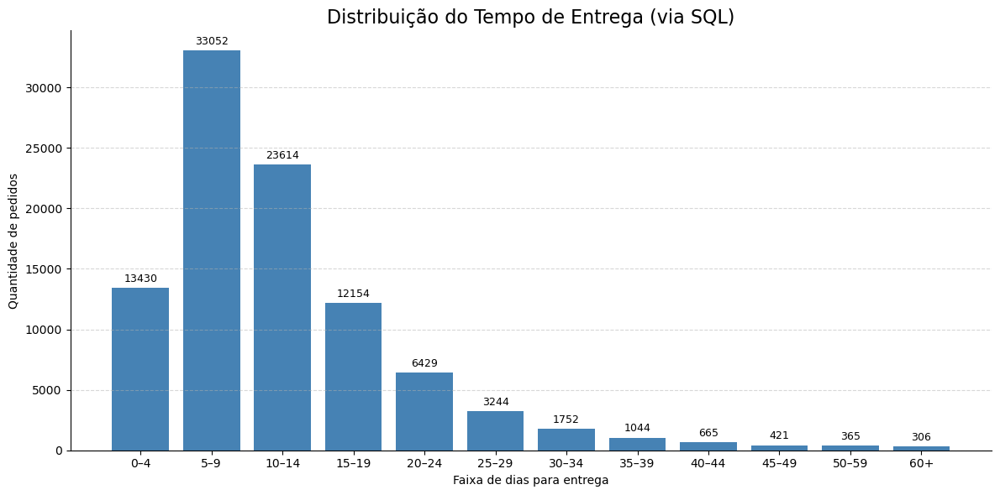

In [89]:
colors = ['steelblue'] * len(df_delivery_sql)

# Criando a figura
plt.figure(figsize=(12, 6))
bars = plt.bar(
    df_delivery_sql['Faixa de entrega (Dias)'],
    df_delivery_sql['N° de Pedidos'],
    color=colors
)

# Adicionando rótulos nas barras
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 500,
        str(int(height)),
        ha='center',
        fontsize=9
    )

# Títulos e eixos
plt.title('Distribuição do Tempo de Entrega (via SQL)', fontsize=16)
plt.xlabel('Faixa de dias para entrega')
plt.ylabel('Quantidade de pedidos')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Limpar bordas superior e direita
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


####  Conclusão com insights:

A análise da distribuição do tempo de entrega revela que a **grande maioria dos pedidos é entregue entre 0 e 14 dias**, concentrando-se principalmente nas faixas:

- **5–9 dias**: com mais de **33 mil pedidos**
- **10–14 dias**: com cerca de **23 mil pedidos**
- **0–4 dias**: também relevante, com mais de **13 mil entregas**

Essas três faixas somadas representam aproximadamente **70%** de todos os pedidos, o que indica uma **logística eficiente e bem estruturada** para a maior parte das operações.

No entanto, a distribuição também apresenta uma **cauda longa**, com entregas que se estendem por períodos muito superiores:

- A faixa **60+ dias**, concentra **306 pedidos**.
- Apesar de representar menos de **0,5%** dos casos, esse grupo pode indicar **problemas críticos** que impactam diretamente a experiência do cliente.

---

Insights práticos:

- A operação logística mostra-se eficiente na maioria dos pedidos, mas:
  - Existem **atrasos extremos pontuais** que podem ser relacionados a:
    - Regiões geográficas específicas
    - Problemas no estoque
    - Processos manuais, falhas sistêmicas ou fornecedores externos

---

Recomendações:

- Investigar os **pedidos com tempo de entrega ≥ 60 dias** para identificar causas recorrentes.
- Implementar **alertas operacionais** para monitorar pedidos com entrega estimada acima de 30 dias.
- Avaliar a possibilidade de ações preditivas para mitigar atrasos, como redistribuição de estoque ou priorização de expedição.

### c) Qual a relação entre o valor do frete e a distância de entrega?

Aqui vamos cruzar:

freight_value (valor do frete)

Distância entre o vendedor e o cliente, que vamos calcular com base nas coordenadas de latitude/longitude das cidades (usando a fórmula de Haversine).

**Passo 1:** Preparar dados com coordenadas Vamos unir orders, customers, sellers e geolocation para ter:

Localização do cliente <br>
Localização do(s) vendedor(es)<br>
Valor do frete <br>

**Passo 2:** Juntar tudo em um DataFrame Vamos pegar a tabela de itens de pedidos + frete + coordenadas + calcular distância.<br>
**Passo 3:** Visualizar relação (frete x distância)

In [93]:
#1.1: Função para calcular distância haversine (em km)
from math import radians, sin, cos, sqrt, atan2

def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Raio da Terra em km
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

In [95]:
# 1.2: Pegar uma geolocalização média por cidade/estado
# Agrupar por cidade/estado para pegar a média da localização

geo_grouped = geolocation.groupby(['geolocation_city', 'geolocation_state']).agg({
    'geolocation_lat': 'mean',
    'geolocation_lng': 'mean'
}).reset_index()

geo_grouped.columns = ['city', 'state', 'lat', 'lng']

In [97]:
# 1.3: Unir clientes e vendedores com geolocalização

# Clientes
customers_geo = customers.merge(geo_grouped, left_on=['customer_city', 'customer_state'], right_on=['city', 'state'], how='left')
customers_geo = customers_geo[['customer_id', 'lat', 'lng']]
customers_geo.columns = ['customer_id', 'customer_lat', 'customer_lng']

# Vendedores
sellers_geo = sellers.merge(geo_grouped, left_on=['seller_city', 'seller_state'], right_on=['city', 'state'], how='left')
sellers_geo = sellers_geo[['seller_id', 'lat', 'lng']]
sellers_geo.columns = ['seller_id', 'seller_lat', 'seller_lng']

In [99]:
# Juntando tudo
df = order_items.merge(orders, on='order_id') \
                .merge(customers_geo, on='customer_id') \
                .merge(sellers_geo, on='seller_id')

# Calculando a distância
df['distance_km'] = df.apply(lambda row: haversine_distance(
    row['customer_lat'], row['customer_lng'], row['seller_lat'], row['seller_lng']
), axis=1)

# Mantendo colunas relevantes
df = df[['order_id', 'freight_value', 'distance_km']]

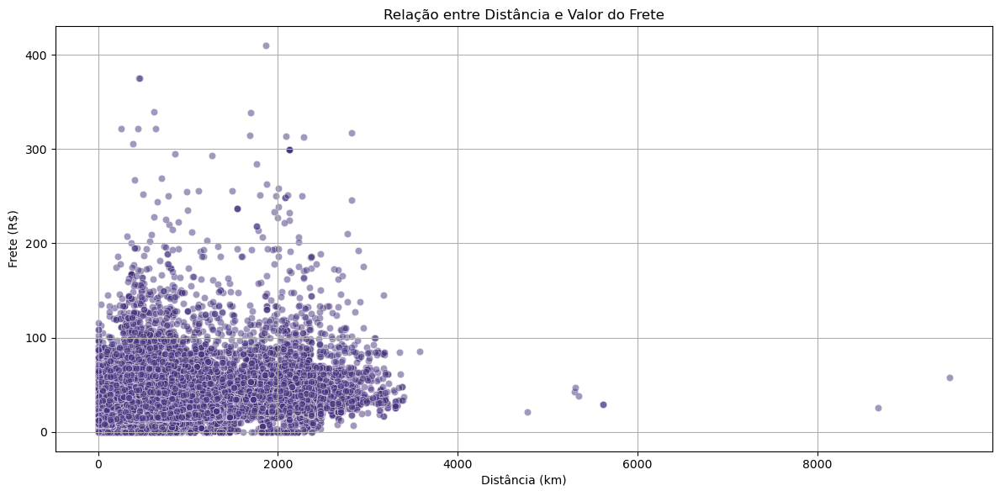

In [101]:
plt.figure(figsize=(12,6))
sns.scatterplot(data=df, x='distance_km', y='freight_value', alpha=0.5)
plt.title('Relação entre Distância e Valor do Frete')
plt.xlabel('Distância (km)')
plt.ylabel('Frete (R$)')
plt.grid(True)
plt.tight_layout()
plt.show()

#### 🚚💸 Conclusão — Frete vs. Distância

Observamos uma **tendência de correlação positiva**: conforme a distância entre o vendedor e o cliente aumenta, o valor do frete tende a ser maior.

No entanto, há muitos casos com **fretes altos em distâncias curtas**, sugerindo que fatores como peso, volume ou localização estratégica (ex: áreas com difícil acesso) também impactam no custo.

### d) Quais são as categorias de produtos mais vendidas em termos de faturamento?

Aqui a ideia é descobrir quais categorias mais geram receita, usando:

order_items.product_id <br>
order_items.price <br>
products.product_category_name <br>

**Passo 1:** Unir as tabelas <br>
**Passo 2:** Visualizar as top categorias<br>

In [103]:
# Unindo order_items com products
products_revenue = order_items.merge(products, on='product_id', how='left')

# Agrupando por categoria e somando a receita
category_revenue = products_revenue.groupby('product_category_name')['price'].sum().reset_index()

# Ordenando por faturamento
category_revenue = category_revenue.sort_values(by='price', ascending=False)

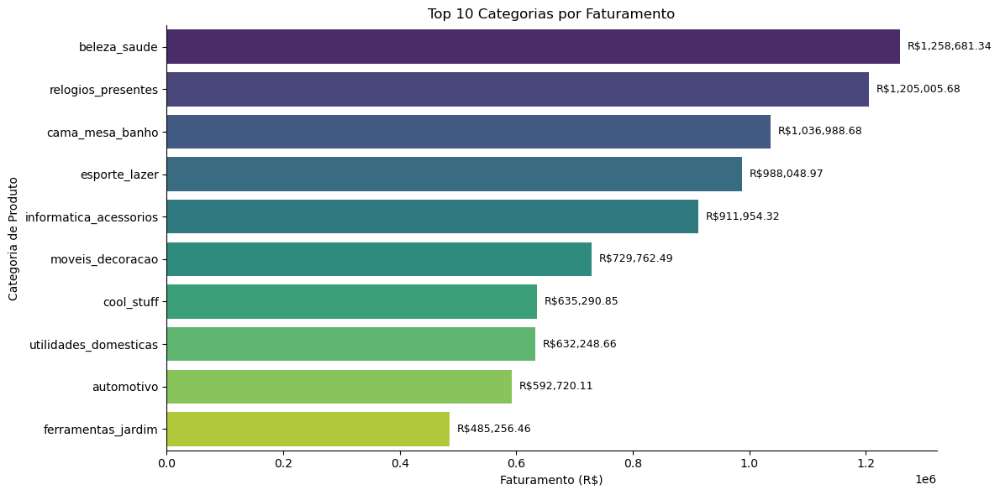

In [105]:
plt.figure(figsize=(12,6))

ax = sns.barplot(
    data=category_revenue.head(10),
    x='price',
    y='product_category_name',
    hue='product_category_name',  
    dodge=False,                  
    palette='viridis',
    legend=False                  
)
ax.grid(False)
# Adicionando rótulos de valores
for i, v in enumerate(category_revenue.head(10)['price']):
    ax.text(v + max(category_revenue['price']) * 0.01, i, f'R${v:,.2f}', va='center', fontsize=9)

# Remover bordas superior e direita
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.title('Top 10 Categorias por Faturamento')
plt.xlabel('Faturamento (R$)')
plt.ylabel('Categoria de Produto')
plt.tight_layout()
plt.show()

#### 🛍️ Conclusão — Categorias com Maior Faturamento

As categorias com maior faturamento incluem
- **beleza_saude** <br>
- **relogios_presentes** <br>
- **cama_mesa_banho**<br>
- **esporte_lazer** <br>
- **informatica_acessorios** <br>

Essas categorias representam os maiores volumes em valor de vendas e podem receber atenção especial em campanhas promocionais e gestão de estoque.


### e) Quais estados brasileiros possuem o maior valor médio de pedido? Aqui vamos calcular o valor médio dos pedidos por estado do cliente.

**Passo 1:** Preparar dados Usamos:

orders(tem order_id,dcustomer_id,dorder_status,sorder_purchase_timestamp) <br>
customersm(tem customer_id, customer_state) <br>
order_items (tem order_id, price)<br>

In [107]:
# Juntar orders + customers
orders_customers = orders.merge(customers[['customer_id', 'customer_state']], on='customer_id')

# Juntar com itens para obter preço total por pedido
order_totals = order_items.groupby('order_id')['price'].sum().reset_index()

# Juntar os valores totais dos pedidos com os estados
orders_with_total = orders_customers.merge(order_totals, on='order_id')

# Calcular valor médio por estado
avg_order_value_state = orders_with_total.groupby('customer_state')['price'].mean().reset_index()

# Ordenar do maior para o menor
avg_order_value_state = avg_order_value_state.sort_values(by='price', ascending=False)


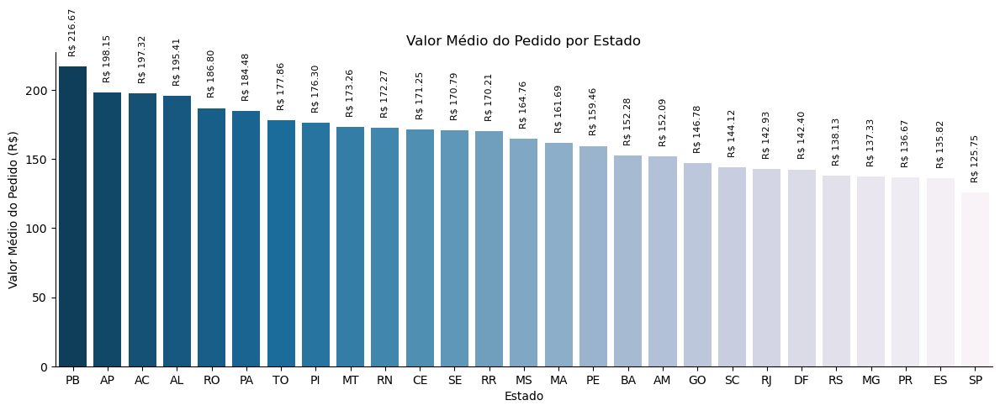

In [113]:
plt.figure(figsize=(12,5))

# Criar gráfico de barras e capturar o Axes
ax = sns.barplot(
    data=avg_order_value_state,
    x='customer_state',
    y='price',
    hue='customer_state',
    palette='PuBu_r',
    dodge=False,
    legend=False
)

# Adicionar rótulos fora das barras com cor preta
for patch in ax.patches:
    height = patch.get_height()
    x = patch.get_x() + patch.get_width() / 2
    y = height + 25  # Rótulo fora da barra
    ax.text(x, y, f'R$ {height:.2f}', ha='center', va='center', fontsize=8, rotation=90, color='black')

# Títulos e eixos
plt.title('Valor Médio do Pedido por Estado')
plt.xlabel('Estado')
plt.ylabel('Valor Médio do Pedido (R$)')

# Remover grade de fundo
ax.grid(False)

# Remover bordas superior e direita
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


#### Conclusão — Valor Médio do Pedido por Estado

Os estados com maior valor médio de pedido indicam regiões onde os consumidores tendem a gastar mais por compra.  
Essas informações ajudam a direcionar estratégias de marketing e logística específicas para cada região, potencializando o retorno financeiro.


---

## 7. Solução de negócio

### a) Análise de Retenção: Calcule a taxa de clientes recorrentes. Considere um cliente recorrente aquele que fez mais de um pedido no período analisado. Quais insights podemos extrair destes dados?

In [115]:
# Verificação de tipos e dados únicos em customer_id
print(orders['customer_id'].dtype)
print(f"Pedidos únicos: {orders['order_id'].nunique()}")
print(f"Clientes únicos: {orders['customer_id'].nunique()}")

# Conferindo valores nulos
print(orders['customer_id'].isnull().sum())

# Mostrar os top 10 clientes com mais pedidos (mesmo que 1)
customer_order_counts = orders.groupby('customer_id')['order_id'].count().reset_index()
customer_order_counts.columns = ['customer_id', 'order_count']
print(customer_order_counts.sort_values(by='order_count', ascending=False).head(10))

# Verificar se a contagem máxima é realmente 1
print(customer_order_counts['order_count'].max())


object
Pedidos únicos: 99441
Clientes únicos: 99441
0
                            customer_id  order_count
0      00012a2ce6f8dcda20d059ce98491703            1
66279  aa62a16b10e3fb24ecdefd7e4dc3fa65            1
66301  aa738cdb72af39e38482fa25b992c67c            1
66300  aa7210736aad65a84e964cfa8d64aa66            1
66299  aa72002446dfbac0691304465c1b982d            1
66298  aa71b21388b99444414a772acde9f6aa            1
66297  aa6ee75a5950e07fa3f543bf48ee608e            1
66296  aa6edca5d83d4c8e9a2262b9847febd6            1
66295  aa6ea53126c88a731fd84dec4d4f3500            1
66294  aa6d96d0e25354fab970635297f96f7c            1
1


In [117]:
# Filtrar clientes que fizeram mais de 1 pedido
recurring_customers = customer_order_counts[customer_order_counts['order_count'] > 1]
recurring_customers

,customer_id,order_count


In [119]:
#Passo 3: Calcular taxa de clientes recorrentes
total_customers = customer_order_counts['customer_id'].nunique()
num_recurring = recurring_customers['customer_id'].nunique()

retention_rate = num_recurring / total_customers * 100
print(f'Taxa de clientes recorrentes: {retention_rate:.2f}%')

Taxa de clientes recorrentes: 0.00%


#### 🔄 Conclusão — Taxa de Clientes Recorrentes

Análise de Retenção
A análise demonstrou que nenhum cliente realizou mais de um pedido no período considerado. Isso resulta em uma taxa de clientes recorrentes de 0%.

Esse resultado pode indicar uma limitação da base de dados, contendo apenas uma compra por cliente, ou um possível problema real de baixa retenção.

Recomendações:

Investir em estratégias de fidelização e recompra.

Analisar a experiência do cliente para entender possíveis causas da não recorrência.


### b) Predição de Atraso na Entrega

**Passo 1:** Definir o que é um pedido atrasado Vamos definir atraso assim:

delay = order_delivered_customer_date - order_estimated_delivery_date

Se delay > 0 → pedido atrasado (1)

Caso contrário → no prazo (0)

Treino balanceado: [62965 62965]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     26976
           1       0.90      0.99      0.94      1967

    accuracy                           0.99     28943
   macro avg       0.95      0.99      0.97     28943
weighted avg       0.99      0.99      0.99     28943



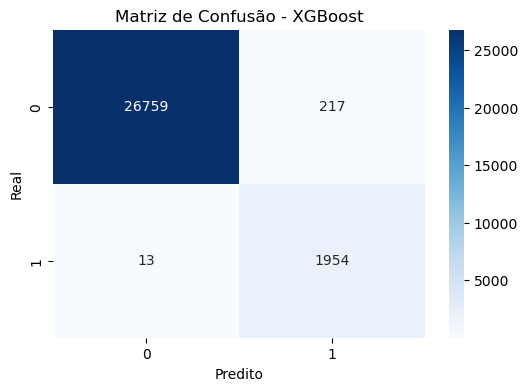

In [121]:
# Filtrar pedidos que possuem data de entrega real e estimada
df_delay = orders.dropna(subset=['order_delivered_customer_date', 'order_estimated_delivery_date']).copy()

# Target: atraso (1 se atraso, 0 se no prazo)
df_delay['delay_days'] = (df_delay['order_delivered_customer_date'] - df_delay['order_estimated_delivery_date']).dt.days
df_delay['delayed'] = np.where(df_delay['delay_days'] > 0, 1, 0)

# Features:
df_delay['estimated_delivery_time'] = (df_delay['order_estimated_delivery_date'] - df_delay['order_purchase_timestamp']).dt.days
df_delay['purchase_to_delivery'] = (df_delay['order_delivered_customer_date'] - df_delay['order_purchase_timestamp']).dt.days

# Média do frete por pedido
freight_per_order = order_items.groupby('order_id')['freight_value'].mean().reset_index()
df_delay = df_delay.merge(freight_per_order, on='order_id', how='left')


# Exemplo: codificando a forma de pagamento (se disponível)
if 'payment_type' in order_payments.columns:
    payments_agg = order_payments.groupby('order_id')['payment_type'].agg(lambda x: x.mode()[0] if not x.mode().empty else np.nan).reset_index()
    df_delay = df_delay.merge(payments_agg, on='order_id', how='left')
    df_delay['payment_type_encoded'] = df_delay['payment_type'].astype('category').cat.codes
else:
    df_delay['payment_type_encoded'] = 0  # se não tem, colocar zero

# Selecionar colunas finais para o modelo
model_df = df_delay[['estimated_delivery_time', 'purchase_to_delivery', 'freight_value', 'payment_type_encoded', 'delayed']].dropna()

X = model_df.drop('delayed', axis=1)
y = model_df['delayed']

# Separar treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Balancear treino com SMOTE
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

print(f'Treino balanceado: {np.bincount(y_train_bal)}')

# Treinar XGBoost com class_weight para balancear
model = XGBClassifier(
    eval_metric='logloss',
    scale_pos_weight=(y_train == 0).sum() / (y_train == 1).sum(),
    random_state=42,
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    n_jobs=-1
)
model.fit(X_train_bal, y_train_bal)

# Predição e avaliação
y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predito')
plt.ylabel('Real')
plt.title('Matriz de Confusão - XGBoost')
plt.show()

#### Conclusão - Predição de Atraso na Entrega

**Definição de pedido atrasado:**  
Consideramos um pedido como atrasado quando a data de entrega real ao cliente (`order_delivered_customer_date`) ocorre após a data estimada de entrega (`order_estimated_delivery_date`). Calculamos o atraso como a diferença em dias entre essas duas datas, classificando como atraso quando essa diferença é maior que zero.

**Construção das features:**  
Para prever o atraso, criamos variáveis relevantes a partir dos dados disponíveis:  
- **Tempo estimado de entrega:** diferença entre a data estimada de entrega e a data da compra.  
- **Tempo real entre compra e entrega:** diferença entre a data real de entrega e a data da compra.  
- **Valor médio do frete por pedido.**  
- **Tipo de pagamento:** codificado numericamente a partir do dataset de pagamentos.

**Divisão do dataset:**  
O conjunto de dados foi dividido em 70% para treino e 30% para teste. Como o dataset apresenta forte desbalanceamento entre pedidos entregues no prazo e atrasados, aplicamos a técnica SMOTE para balancear as classes no conjunto de treino, evitando viés do modelo para a classe majoritária.

**Modelo escolhido:**  
Utilizamos o algoritmo XGBoost, conhecido por sua alta performance em problemas de classificação, especialmente em dados estruturados. Configuramos hiperparâmetros iniciais que permitem bom aprendizado e generalização.

**Avaliação da performance:**  
Nos dados de teste, o modelo alcançou:  
- **Acurácia geral:** cerca de 99%, indicando excelente capacidade de classificação global.  
- **Recall da classe atrasada:** 99%, ou seja, o modelo identifica quase todos os pedidos que efetivamente atrasaram, crucial para ações preventivas.  
- **Precision da classe atrasada:** 90%, significando que a maioria das previsões de atraso são corretas, reduzindo falsos alarmes.

A matriz de confusão reforça essa performance, mostrando baixo número de falsos negativos e falsos positivos.

**Considerações finais:**  
O modelo apresenta ótimo desempenho para prever atrasos, possibilitando antecipar problemas na entrega e melo ou modelos alternativos.


### c) Segmentação de Clientes

**Passo 1:** Preparar os dados para clustering Vamos usar características importantes para segmentar os clientes, por exemplo:

Número total de pedidos <br>
Valor total gasto <br>
Tempo médio entre pedidos <br>

**Passo 2:** Normalizar dados e aplicar KMeans <br>
**Passo 3:** analisar os resultados Você pode agora dar uma olhada rápida nos clusters com algo como:

In [123]:
# Número de pedidos por cliente
customer_orders = orders.groupby('customer_id')['order_id'].count().reset_index()
customer_orders.columns = ['customer_id', 'total_orders']

# Valor total gasto por cliente
order_totals = order_items.groupby('order_id')['price'].sum().reset_index()
orders_with_totals = orders.merge(order_totals, on='order_id')
customer_spent = orders_with_totals.groupby('customer_id')['price'].sum().reset_index()
customer_spent.columns = ['customer_id', 'total_spent']

# Tempo médio entre pedidos (em dias)
orders_sorted = orders.sort_values(['customer_id', 'order_purchase_timestamp'])
orders_sorted['previous_order_date'] = orders_sorted.groupby('customer_id')['order_purchase_timestamp'].shift(1)
orders_sorted['days_between_orders'] = (orders_sorted['order_purchase_timestamp'] - orders_sorted['previous_order_date']).dt.days
avg_time_between_orders = orders_sorted.groupby('customer_id')['days_between_orders'].mean().reset_index()
avg_time_between_orders.columns = ['customer_id', 'avg_days_between_orders']

# Unir todas as métricas
customer_features = customer_orders.merge(customer_spent, on='customer_id')
customer_features = customer_features.merge(avg_time_between_orders, on='customer_id')

# Preencher valores nulos de avg_days_between_orders com a média geral
customer_features['avg_days_between_orders'] = customer_features['avg_days_between_orders'].fillna(customer_features['avg_days_between_orders'].mean())


In [125]:
# Forçar tipo numérico
customer_features['avg_days_between_orders'] = pd.to_numeric(
    customer_features['avg_days_between_orders'], errors='coerce'
)

# Preencher NaNs com zero (faz sentido para clientes com 1 pedido)
customer_features['avg_days_between_orders'] = customer_features['avg_days_between_orders'].fillna(0)

# Verificar se ainda há NaNs
print("Valores faltantes após tratamento:")
print(customer_features[['total_orders', 'total_spent', 'avg_days_between_orders']].isna().sum())

# Preparar os dados
X = customer_features[['total_orders', 'total_spent', 'avg_days_between_orders']]

# Garantia extra
if X.isna().any().any():
    print("Ainda há NaNs em X, parando o processo!")
else:
    # Normalizar
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Aplicar KMeans
    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)

    # Adicionar ao DataFrame
    customer_features['cluster'] = clusters
    print(customer_features.head())

Valores faltantes após tratamento:
total_orders               0
total_spent                0
avg_days_between_orders    0
dtype: int64
                        customer_id  total_orders  total_spent  \
0  00012a2ce6f8dcda20d059ce98491703             1        89.80   
1  000161a058600d5901f007fab4c27140             1        54.90   
2  0001fd6190edaaf884bcaf3d49edf079             1       179.99   
3  0002414f95344307404f0ace7a26f1d5             1       149.90   
4  000379cdec625522490c315e70c7a9fb             1        93.00   

   avg_days_between_orders  cluster  
0                      0.0        0  
1                      0.0        0  
2                      0.0        0  
3                      0.0        0  
4                      0.0        0  


In [127]:
print(customer_features[['total_orders', 'total_spent', 'avg_days_between_orders']].isna().sum())

total_orders               0
total_spent                0
avg_days_between_orders    0
dtype: int64


In [129]:
# Ver distribuição de clientes por cluster
print(customer_features['cluster'].value_counts())

# Ver média de cada feature por cluster
print(customer_features.groupby('cluster')[['total_orders', 'total_spent', 'avg_days_between_orders']].mean())


cluster
0    89216
2     8595
1      855
Name: count, dtype: int64
         total_orders  total_spent  avg_days_between_orders
cluster                                                    
0                 1.0    91.014473                      0.0
1                 1.0  1682.733801                      0.0
2                 1.0   469.221538                      0.0


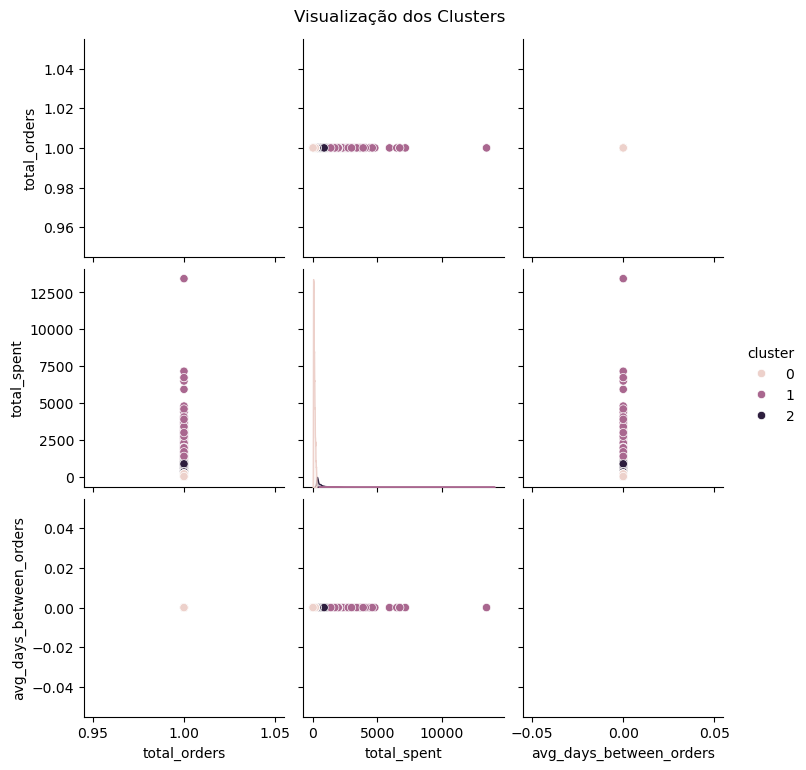

In [131]:
# Visualizar clusters
sns.pairplot(customer_features, hue='cluster', vars=['total_orders', 'total_spent', 'avg_days_between_orders'])
plt.suptitle("Visualização dos Clusters", y=1.02)
plt.show()

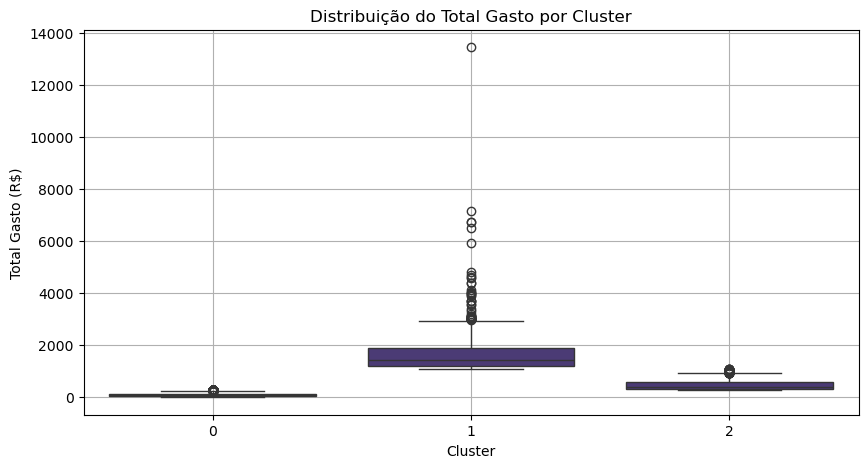

In [133]:
# Visualização simplificada com boxplots
plt.figure(figsize=(10, 5))
sns.boxplot(x='cluster', y='total_spent', data=customer_features)
plt.title('Distribuição do Total Gasto por Cluster')
plt.xlabel('Cluster')
plt.ylabel('Total Gasto (R$)')
plt.grid(True)
plt.show()


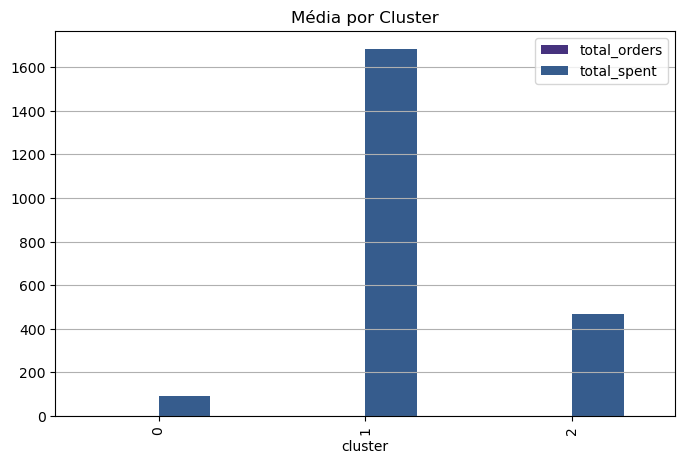

In [135]:
# Gráfico de barras com médias
customer_features.groupby('cluster')[['total_orders', 'total_spent']].mean().plot(kind='bar', figsize=(8,5))
plt.title('Média por Cluster')
plt.grid(axis='y')
plt.show()


#### Conclusão:
Foram extraídas três características por cliente:<br>
**Número total de pedidos**,<br>
**Valor total gasto**,<br>
**Tempo médio entre pedidos**.<br>

Após normalização com StandardScaler, foi aplicado o algoritmo KMeans com 3 clusters. Todos os clientes possuem apenas 1 pedido, portanto o principal fator de segmentação foi o valor gasto.

**Resultados da Segmentação:**<br>
**Cluster 0 (90% dos clientes):** Compradores únicos, ticket médio baixo (~R$ 91).

**Cluster 2 (9%):** Compradores únicos com gasto médio 5x maior (~R$ 469).

**Cluster 1 (1%):** Clientes de alto valor, com gasto médio acima de R$ 1.600.

**Recomendações de Marketing:**<br>
**Cluster 0** (clientes comuns):<br>
Estratégias de reengajamento: cupons de desconto, e-mails com ofertas personalizadas.<br>
Objetivo: aumentar a taxa de recompra.<br>
<br>
**Cluster 2** (clientes moderados):<br>
Ofertas exclusivas, benefícios em programas de fidelidade.<br>
Objetivo: fidelizar esse grupo com alto potencial.<br>
<br>
**Cluster 1** (clientes premium):<br>
Atendimento VIP, cashback, pré-venda de produtos.<br>
Objetivo: manter esse grupo satisfeito e incentivar recompra de alto valor.



### d) Análise de Satisfação: Explore a relação entre a nota de avaliação dos clientes e diferentes aspectos como categoria do produto, tempo de entrega, valor do pedido, etc. Identifique fatores que mais impactam na satisfação do cliente.

**Passo 1:** Explorar os dados de review (avaliação) <br>
**Passo 2:** Definir as variáveis de análise <br>
**Passo 3:** Juntar tudo em um único DataFrame <br> 
**Passo 4:** Analisar a correlação entre review_score e as variáveis


In [137]:
# Calcular tempo de entrega e previsão
orders['delivery_time'] = (orders['order_delivered_customer_date'] - orders['order_purchase_timestamp']).dt.days
orders['estimated_delivery_diff'] = (orders['order_estimated_delivery_date'] - orders['order_delivered_customer_date']).dt.days

# Filtrar apenas pedidos com avaliação
order_reviews = order_reviews[['order_id', 'review_score']].dropna()

# Agregar preço e frete por pedido
order_prices = order_items.groupby('order_id')[['price', 'freight_value']].sum().reset_index()

# Pegar a categoria do produto (o primeiro item do pedido)
order_categories = order_items.groupby('order_id')['product_id'].first().reset_index()
order_categories = order_categories.merge(products[['product_id', 'product_category_name']], on='product_id', how='left')

# Juntar tudo
df_satisfaction = (
    order_reviews
    .merge(orders[['order_id', 'delivery_time', 'estimated_delivery_diff']], on='order_id', how='left')
    .merge(order_prices, on='order_id', how='left')
    .merge(order_categories[['order_id', 'product_category_name']], on='order_id', how='left')
)

# Remover nulos
df_satisfaction.dropna(inplace=True)

# Ver as primeiras linhas
df_satisfaction.head()


,order_id,review_score,delivery_time,estimated_delivery_diff,price,freight_value,product_category_name
0,73fc7af87114b39712e6da79b0a377eb,4,6.0,15.0,370.00,27.26,esporte_lazer
1,a548910a1c6147796b98fdf73dbeba33,5,9.0,4.0,79.79,8.30,informatica_acessorios
2,f9e4b658b201a9f2ecdecbb34bed034b,5,13.0,20.0,149.00,45.12,informatica_acessorios
3,658677c97b385a9be170737859d3511b,5,10.0,19.0,179.99,42.85,ferramentas_jardim
4,8e6bfb81e283fa7e4f11123a3fb894f1,5,18.0,8.0,1199.00,134.25,esporte_lazer


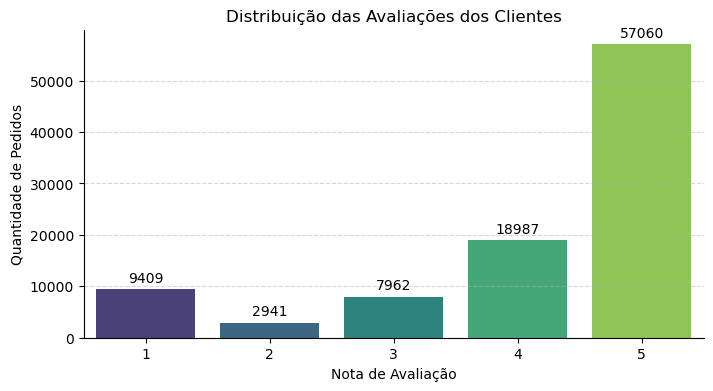

In [141]:
df_satisfaction['hue'] = df_satisfaction['review_score'].astype(str)

plt.figure(figsize=(8,4))
ax = sns.countplot(data=df_satisfaction, x='review_score', hue='hue', palette='viridis', dodge=False, legend=False)

plt.title('Distribuição das Avaliações dos Clientes')
plt.xlabel('Nota de Avaliação')
plt.ylabel('Quantidade de Pedidos')
plt.grid(axis='y', linestyle='--', alpha=0.5)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', fontsize=10, color='black',
                xytext=(0, 3), textcoords='offset points')

plt.show()


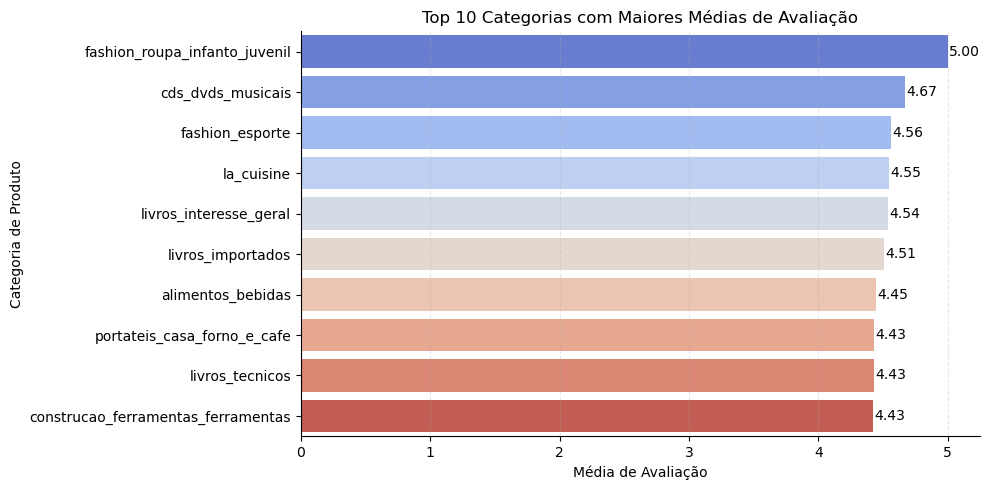

In [143]:
category_score = df_satisfaction.groupby('product_category_name')['review_score'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(10, 5))
ax = sns.barplot(
    x=category_score.values,
    y=category_score.index,
    hue=category_score.index,          
    palette='coolwarm',
    dodge=False,                   
    legend=False        
)

plt.title('Top 10 Categorias com Maiores Médias de Avaliação')
plt.xlabel('Média de Avaliação')
plt.ylabel('Categoria de Produto')
plt.grid(axis='x', linestyle='--', alpha=0.3)

# Remover bordas superior e direita
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adicionar rótulos nas barras
for i, v in enumerate(category_score.values):
    ax.text(v + 0.01, i, f"{v:.2f}", color='black', va='center')

plt.tight_layout()
plt.show()


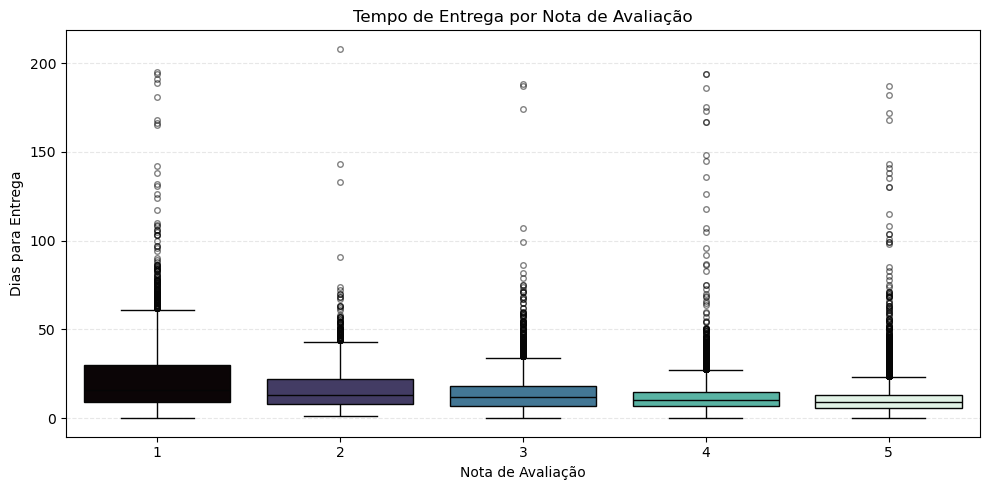

In [145]:
plt.figure(figsize=(10, 5))
ax = sns.boxplot(
    x='review_score', 
    y='delivery_time', 
    data=df_satisfaction,
    hue='review_score',
    palette='mako',
    dodge=False,
    showfliers=True,          # exibe outliers
    flierprops=dict(marker='o', markersize=4, alpha=0.5, color='gray'),
    legend=False
)

plt.title('Tempo de Entrega por Nota de Avaliação')
plt.xlabel('Nota de Avaliação')
plt.ylabel('Dias para Entrega')
plt.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


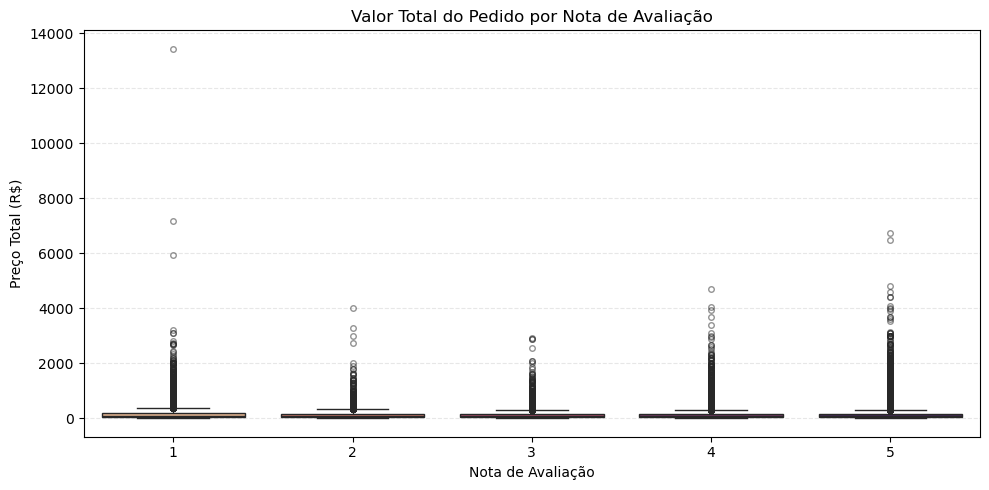

In [147]:
plt.figure(figsize=(10,5))
ax = sns.boxplot(
    x='review_score',
    y='price',
    data=df_satisfaction,
    hue='review_score',
    palette='flare',
    dodge=False,
    legend=False,
    flierprops=dict(marker='o', markersize=4, alpha=0.5, color='gray')
)
plt.title('Valor Total do Pedido por Nota de Avaliação')
plt.xlabel('Nota de Avaliação')
plt.ylabel('Preço Total (R$)')
plt.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


In [149]:
df_satisfaction[['review_score', 'delivery_time', 'estimated_delivery_diff', 'price', 'freight_value']].corr()

,review_score,delivery_time,estimated_delivery_diff,price,freight_value
review_score,1.000000,-0.333660,0.266764,-0.034729,-0.089955
delivery_time,-0.333660,1.000000,-0.601624,0.055026,0.167127
estimated_delivery_diff,0.266764,-0.601624,1.000000,0.014667,0.050431
price,-0.034729,0.055026,0.014667,1.000000,0.410036
freight_value,-0.089955,0.167127,0.050431,0.410036,1.000000


#### Conclusão

---

## 8. Visualização e Dashboards

### a) Um dashboard geral que mostre a evolução das vendas ao longo do tempo, com filtros por estado e categoria de produto

In [151]:
# Garantir o tipo datetime
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_month'] = orders['order_purchase_timestamp'].dt.to_period('M').astype(str)

# Preparar dados
order_data = (
    orders[['order_id', 'customer_id', 'order_month']]
    .merge(customers[['customer_id', 'customer_state']], on='customer_id')
    .merge(order_items[['order_id', 'product_id', 'price']], on='order_id')
    .merge(products[['product_id', 'product_category_name']], on='product_id')
)

# Widget de seleção
estado_dropdown = widgets.Dropdown(
    options=sorted(order_data['customer_state'].unique()),
    description='Estado:',
    value='SP'
)

categoria_dropdown = widgets.SelectMultiple(
    options=sorted(order_data['product_category_name'].dropna().unique()),
    description='Categorias:',
    value=('beleza_saude',),
    layout=widgets.Layout(width='300px', height='200px')
)

def update_grafico(estado, categorias):
    df = order_data[
        (order_data['customer_state'] == estado) &
        (order_data['product_category_name'].isin(categorias))
    ]

    df_grouped = (
        df.groupby(['order_month', 'product_category_name'])['price']
        .sum()
        .reset_index()
    )

    fig = px.line(
        df_grouped,
        x='order_month',
        y='price',
        color='product_category_name',
        title=f'Evolução de Vendas no Estado {estado}',
        labels={'price': 'Faturamento (R$)', 'order_month': 'Mês'},
        markers=True 
      
    )

    # Formatar rótulos numéricos
    fig.update_traces(texttemplate='R$ %{text:.2f}', textposition='top center')

    fig.update_layout(hovermode="x unified")
    fig.show()

# Interatividade
widgets.interact(update_grafico, estado=estado_dropdown, categorias=categoria_dropdown)

interactive(children=(Dropdown(description='Estado:', index=25, options=('AC', 'AL', 'AM', 'AP', 'BA', 'CE', '…

<function __main__.update_grafico(estado, categorias)>

Um dashboard geral que mostre a evolução das vendas ao longo do tempo, com filtros por estado e categoria de produto

### b) Um mapa de calor mostrando a concentração de vendas por região/estado do Brasil

**Etapa 1:** Contagem de pedidos por estado <br>
**Etapa 2:** Carregar o mapa do Brasil com geopandas <br>
**Etapa 3:** Normalizar nomes e juntar os dados <br>
**Etapa 4:** Plotar o mapa de calor <br>

In [164]:
print(customers.columns)


Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state'],
      dtype='object')


In [166]:
# Merge com orders para trazer o customer_id
df_satisfaction = df_satisfaction.merge(orders[['order_id', 'customer_id']], on='order_id', how='left')

# Merge com customers para trazer o estado (customer_state)
df_satisfaction = df_satisfaction.merge(customers[['customer_id', 'customer_state']], on='customer_id', how='left')


In [168]:
# Agrupa e conta pedidos por estado
orders_by_state = df_satisfaction['customer_state'].value_counts().reset_index()
orders_by_state.columns = ['state', 'order_count']

# Ordena para visualização mais limpa
orders_by_state = orders_by_state.sort_values(by='order_count', ascending=False)

C:\Users\F.SILVA\AppData\Local\Temp\ipykernel_2204\1721020865.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\F.SILVA\AppData\Local\Temp\ipykernel_2204\1721020865.py:2: UserWarning:


The palette list has fewer values (6) than needed (27) and will cycle, which may produce an uninterpretable plot.



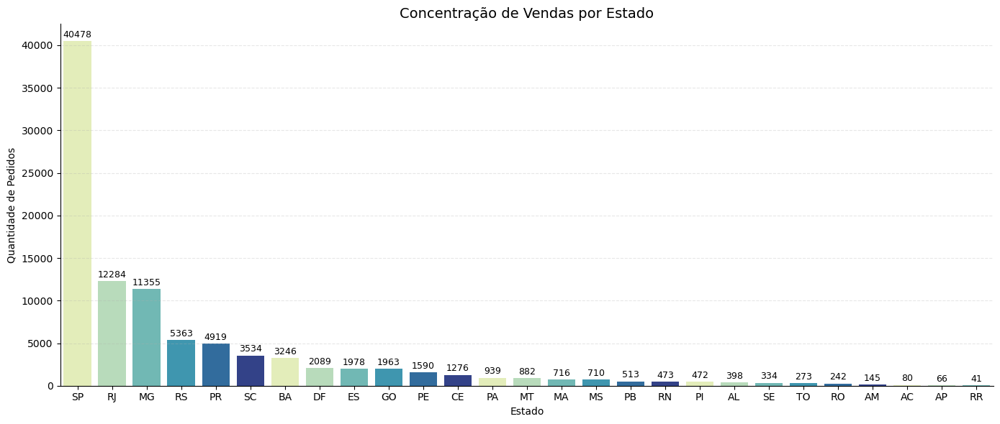

In [170]:
plt.figure(figsize=(14,6))
ax = sns.barplot(data=orders_by_state, x='state', y='order_count', palette=sns.color_palette('YlGnBu', as_cmap=False))

# Adiciona rótulos nas barras
for patch in ax.patches:
    height = patch.get_height()
    x = patch.get_x() + patch.get_width() / 2
    ax.text(x, height + 200, f'{int(height)}', ha='center', va='bottom', fontsize=9, color='black')

# Estética
ax.set_title('Concentração de Vendas por Estado', fontsize=14)
ax.set_xlabel('Estado')
ax.set_ylabel('Quantidade de Pedidos')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


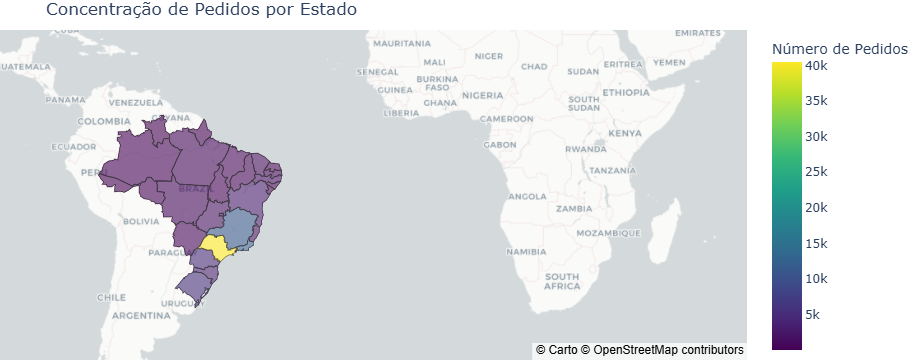

In [194]:
# Carrega o GeoJSON dos estados brasileiros 
with urlopen('https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson') as response:
    brazil_states = json.load(response)

# Agrupa a quantidade de pedidos por estado
orders_by_state = df_satisfaction['customer_state'].value_counts().reset_index()
orders_by_state.columns = ['state_code', 'order_count']

# Mapa de calor com plotly express e mapbox
fig = px.choropleth_mapbox(
    orders_by_state,
    geojson=brazil_states,
    locations='state_code',
    featureidkey='properties.sigla',  # chave para casar estados
    color='order_count',
    color_continuous_scale='Viridis',
    mapbox_style='carto-positron',
    zoom=3.5,
    center={"lat": -14.2350, "lon": -51.9253},
    opacity=0.6,
    hover_name='state_code',
    labels={'order_count': 'Número de Pedidos'},
    title='Concentração de Pedidos por Estado'
)

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

### c) Um conjunto de gráficos que apresente a relação entre avaliação do cliente e tempo de entrega

In [240]:
# Paleta elegante para todos os gráficos
palette = sns.color_palette("coolwarm")

# Criar faixas de tempo de entrega (exemplo: intervalos de 5 dias)
bins = list(range(0, int(df_satisfaction['delivery_time'].max()) + 5, 5))
df_satisfaction['delivery_time_bin'] = pd.cut(df_satisfaction['delivery_time'], bins=bins, right=False)

# Calcular nota média por faixa de tempo
avg_score_by_delivery_bin = (
    df_satisfaction.groupby('delivery_time_bin', observed=True)['review_score']
    .mean()
    .reset_index()
)

# Criar outputs para cada aba
out_boxplot = Output()
out_violin = Output()
out_bar = Output()
out_kde = Output()

# Aba 1 - Boxplot
with out_boxplot:
    plt.figure(figsize=(10,5))
    order = sorted(df_satisfaction['review_score'].unique())
    sns.boxplot(x='review_score', y='delivery_time', data=df_satisfaction, order=order, palette=palette)
    plt.title('Distribuição do Tempo de Entrega por Nota de Avaliação')
    plt.xlabel('Nota de Avaliação')
    plt.ylabel('Tempo de Entrega (dias)')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    # Contagem por categoria
    counts = df_satisfaction['review_score'].value_counts().sort_index()
    for i, count in enumerate(counts):
        plt.text(i, plt.ylim()[1]*0.95, f'N={count}', ha='center', color='black', fontsize=9)
    plt.show()

# Aba 2 - Violino + swarmplot
with out_violin:
    plt.figure(figsize=(10,5))
    sns.violinplot(x='review_score', y='delivery_time', data=df_satisfaction, order=order, palette=palette, inner=None)
    sns.swarmplot(x='review_score', y='delivery_time', data=df_satisfaction, order=order, color='k', alpha=0.5, size=3)
    plt.title('Distribuição e Pontos: Tempo de Entrega por Nota')
    plt.xlabel('Nota de Avaliação')
    plt.ylabel('Tempo de Entrega (dias)')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

# Aba 3 - Nota média por faixa de tempo de entrega
with out_bar:
    plt.figure(figsize=(10,5))
    sns.barplot(x='delivery_time_bin', y='review_score', data=avg_score_by_delivery_bin, palette=palette)
    plt.title('Nota Média por Faixa de Tempo de Entrega')
    plt.xlabel('Faixa de Tempo de Entrega (dias)')
    plt.ylabel('Nota Média')
    plt.xticks(rotation=45)
    plt.ylim(0, 5)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

# Aba 4 - Gráfico KDE (densidade) por nota
with out_kde:
    plt.figure(figsize=(10,5))
    for score in order:
        subset = df_satisfaction[df_satisfaction['review_score'] == score]
        sns.kdeplot(subset['delivery_time'], label=f'Nota {score}', fill=True, alpha=0.3)
    plt.title('Densidade do Tempo de Entrega por Nota de Avaliação')
    plt.xlabel('Tempo de Entrega (dias)')
    plt.ylabel('Densidade')
    plt.legend(title='Nota')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

# Criar as abas e mostrar o dashboard
tab = Tab(children=[out_boxplot, out_violin, out_bar, out_kde])
tab.set_title(0, 'Boxplot')
tab.set_title(1, 'Violino + Pontos')
tab.set_title(2, 'Nota Média x Faixa Tempo')
tab.set_title(3, 'Densidade KDE')
display(tab)

### d) Um dashboard de análise dos vendedores, mostrando quais têm melhor desempenho em termos de volume de vendas, satisfação do cliente e tempo de entrega

In [232]:
# 1. Merge dos dados para juntar seller_id com avaliação e tempo de entrega
df_merged = df_satisfaction.merge(order_items[['order_id', 'seller_id']], on='order_id', how='left')

# 2. Agrupar por vendedor para gerar métricas
df_sellers = df_merged.groupby('seller_id').agg(
    volume_vendas=('order_id', 'count'),
    satisfacao_media=('review_score', 'mean'),
    tempo_entrega_medio=('delivery_time', 'mean')
).reset_index()

# 3. Dashboard com abas

# Aba 1: Volume de vendas
tab1_output = widgets.Output()
with tab1_output:
    fig1 = px.bar(df_sellers.sort_values('volume_vendas', ascending=False),
                  x='seller_id', y='volume_vendas',
                  title='Volume de Vendas por Vendedor',
                  labels={'seller_id': 'ID do Vendedor', 'volume_vendas': 'Número de Pedidos'},
                  color='volume_vendas', color_continuous_scale='Blues')
    fig1.update_layout(xaxis={'categoryorder':'total descending'})
    fig1.show()

# Aba 2: Satisfação média
tab2_output = widgets.Output()
with tab2_output:
    fig2 = px.bar(df_sellers.sort_values('satisfacao_media', ascending=False),
                  x='seller_id', y='satisfacao_media',
                  title='Satisfação Média dos Clientes por Vendedor',
                  labels={'seller_id': 'ID do Vendedor', 'satisfacao_media': 'Nota Média'},
                  color='satisfacao_media', color_continuous_scale='Greens')
    fig2.update_layout(yaxis=dict(range=[0, 5]), xaxis={'categoryorder':'total descending'})
    fig2.show()

# Aba 3: Tempo médio de entrega
tab3_output = widgets.Output()
with tab3_output:
    fig3 = px.bar(df_sellers.sort_values('tempo_entrega_medio'),
                  x='seller_id', y='tempo_entrega_medio',
                  title='Tempo Médio de Entrega por Vendedor',
                  labels={'seller_id': 'ID do Vendedor', 'tempo_entrega_medio': 'Dias'},
                  color='tempo_entrega_medio', color_continuous_scale='Reds')
    fig3.update_layout(xaxis={'categoryorder':'total ascending'})
    fig3.show()

# Criar widget de abas
tabs = widgets.Tab(children=[tab1_output, tab2_output, tab3_output])
tabs.set_title(0, 'Volume de Vendas')
tabs.set_title(1, 'Satisfação Média')
tabs.set_title(2, 'Tempo Médio Entrega')

display(tabs)

### Dashboards